# Bad Anatomy Realism Classifier Model (BARC)
---
A finetuned Vision Transformer model for classifying AI-generated pictures for bad anatomy and realism.

This model is currently a support model for my Youtube series. Feel free to build on top of this.

For the checkpoint weights and to read more:
- https://huggingface.co/angusleung100/bad-anatomy-realism-classifier
- https://github.com/angusleung100/barc-finetuning-gh



In [ ]:
# Import prequisites
!pip install transformers datasets huggingface_hub torch IPython scikit-learn

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [ ]:
# Import prerequisites
import os
import torch
import numpy as np

from transformers import ViTImageProcessor, ViTFeatureExtractor, ViTForImageClassification, Trainer, TrainingArguments
from datasets import load_dataset
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from IPython.display import Image, display
from PIL import Image
from google.colab import userdata, drive
from huggingface_hub import login

In [ ]:
# Script Configuration

drive.mount('/content/drive')

train_test_dir = "/content/drive/My Drive/AI Consistent Generation/train_test"

hf_token = userdata.get('bar_finetune_rw_token') # Hugging Face auth token read/write

model_name = "google/vit-base-patch16-224-in21k"

labels = ["Realistic_Good_Anatomy", "Realistic_Bad_Anatomy", "Unrealistic_Good_Anatomy", "Unrealistic_Bad_Anatomy"]


Mounted at /content/drive


In [ ]:
# Log into Hugging Face Hub for model saving
login(token=userdata.get('bar_finetune_rw_token'))

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: fineGrained).
Your token has been saved to /root/.cache/huggingface/token
Login successful


## Preprocessing and Transforming the Dataset
---
Our first steps for training are to preprocess and transform the dataset. Currently the images are hosted locally are named differently. By giving the images a naming convention, it feels more organized and later image additions to the set won't overwrite existing images due to our custom naming convention.

For creating a HF Dataset from an image folder and its structure, refer to: https://huggingface.co/docs/datasets/en/image_dataset

In [ ]:
# Ensure dataset naming convention is consistent across all classes

import os

files = os.listdir(train_test_dir+"/train")

for folder in files:

  img_id = 0

  imgs = os.listdir(train_test_dir+"/train/"+folder)

  for img in imgs:
    #print(img)

    old_name = os.path.join((train_test_dir+"/train/"+folder), img)
    new_filename = folder + "_" + str(img_id) + ".png"
    new_name = os.path.join((train_test_dir+"/train/"+folder), new_filename)

    img_id += 1
    print(new_name)

    os.rename(old_name, new_name)

/content/drive/My Drive/AI Consistent Generation/train_test/train/Realistic_Bad_Anatomy/Realistic_Bad_Anatomy_0.png
/content/drive/My Drive/AI Consistent Generation/train_test/train/Realistic_Bad_Anatomy/Realistic_Bad_Anatomy_1.png
/content/drive/My Drive/AI Consistent Generation/train_test/train/Realistic_Bad_Anatomy/Realistic_Bad_Anatomy_2.png
/content/drive/My Drive/AI Consistent Generation/train_test/train/Realistic_Bad_Anatomy/Realistic_Bad_Anatomy_3.png
/content/drive/My Drive/AI Consistent Generation/train_test/train/Realistic_Bad_Anatomy/Realistic_Bad_Anatomy_4.png
/content/drive/My Drive/AI Consistent Generation/train_test/train/Realistic_Bad_Anatomy/Realistic_Bad_Anatomy_5.png
/content/drive/My Drive/AI Consistent Generation/train_test/train/Realistic_Good_Anatomy/Realistic_Good_Anatomy_0.png
/content/drive/My Drive/AI Consistent Generation/train_test/train/Realistic_Good_Anatomy/Realistic_Good_Anatomy_1.png
/content/drive/My Drive/AI Consistent Generation/train_test/train/Re

In [ ]:
# Load in train test images as HF dataset

dataset = load_dataset("imagefolder", data_dir=train_test_dir, split="train").shuffle() # https://huggingface.co/docs/datasets/en/image_dataset

dataset = dataset.train_test_split(test_size=0.3) # 70% train and 30% test split

dataset

# NOTE: In future versions, the base train test dataset will be made a HF dataset maybe

Resolving data files:   0%|          | 0/134 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 93
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 41
    })
})

In [ ]:
# Check labels for dataset
dataset['train'].features['label'] # Check labels

ClassLabel(names=['Realistic_Bad_Anatomy', 'Realistic_Good_Anatomy', 'Unrealistic_Bad_Anatomy', 'Unrealistic_Good_Anatomy'], id=None)

In [ ]:
dataset['train'][0]['label']  # First image integer label

2

In [ ]:
# Labels are correct and in order but coded to integers
"""
Note:
0 -> Realistic_Bad_Anatomy
1 -> Realistic_Good_Anatomy
2 -> Unrealistic_Bad_Anatomy
3 -> Unrealistic_Good_Anatomy
"""
dataset['train'].features['label'].int2str(dataset['train'][0]['label'])

'Unrealistic_Bad_Anatomy'

In [ ]:
# Load image processor
image_processor = ViTImageProcessor.from_pretrained(model_name)
image_processor

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

ViTImageProcessor {
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTImageProcessor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

The image processor is used to convert the PIL image into a usable tensor format with the pixels.

**Note:** The image processor should be the same or compatible with the base model used or the tensors that are generated will throw errors and you will have to redo the preprocessing again.

After we import the image processor, we can finally preprocess the entire dataset. Using a custom ```preprocess(examples)``` function and ```map``` from Datasets converts all the images into a valid format for the Trainer.

In [ ]:
# Preprocess and transform images

def preprocess(examples): # Preprocessing function to transform as needed

  images = image_processor(examples['image'], return_tensors='pt')

  images['label'] = examples['label']

  return images

training_set = dataset['train'].map(preprocess, batched=True)
testing_set = dataset['test'].map(preprocess, batched=True)

training_set

Map:   0%|          | 0/93 [00:00<?, ? examples/s]

Map:   0%|          | 0/41 [00:00<?, ? examples/s]

Dataset({
    features: ['image', 'label', 'pixel_values'],
    num_rows: 93
})

In [ ]:
training_set[0]

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=512x512>,
 'label': 3,
 'pixel_values': [[[-0.7254902124404907,
    -0.7098039388656616,
    -0.6235294342041016,
    -0.5215686559677124,
    -0.41960781812667847,
    -0.29411762952804565,
    -0.2078431248664856,
    -0.16862744092941284,
    -0.1764705777168274,
    -0.2078431248664856,
    -0.2549019455909729,
    -0.3019607663154602,
    -0.38823527097702026,
    -0.46666663885116577,
    -0.5607843399047852,
    -0.6627451181411743,
    -0.7490196228027344,
    -0.8039215803146362,
    -0.8352941274642944,
    -0.8509804010391235,
    -0.8196078538894653,
    -0.7568627595901489,
    -0.7333333492279053,
    -0.7411764860153198,
    -0.7254902124404907,
    -0.6313725709915161,
    -0.4823529124259949,
    -0.30980390310287476,
    -0.1450980305671692,
    -0.019607841968536377,
    0.050980448722839355,
    0.058823585510253906,
    0.003921627998352051,
    -0.06666666269302368,
    -0.09019607305526733,
    -0.074

As we no longer need the image column in our dataset, we can remove it to save some space:

In [ ]:
# Remove image column
training_set = training_set.remove_columns('image')
testing_set = testing_set.remove_columns('image')

training_set

Dataset({
    features: ['label', 'pixel_values'],
    num_rows: 93
})

## Metric Evalution Function
---
Surprisingly, HF Trainer does not have a good dedicated function for computing metrics but you have the ability to import the Hugging Face Evaluate library for performance evaluation or you can custom make your own function with a library such as Scikit-Learn. Below we use Scikit-Learn to track Accuracy, Precision, Recall, and F1.

In [ ]:
# Performance Evaluation Function

def compute_metrics(pred):
  preds = pred.predictions.argmax(-1)
  labels = pred.label_ids

  # Scores
  precision = precision_score(labels, preds, average='weighted')
  recall = recall_score(labels, preds, average='weighted')
  accuracy = accuracy_score(labels, preds)
  f1 = f1_score(labels, preds, average='weighted')

  return {'accuracy': accuracy, 'precision': precision, 'recall': recall, 'f1': f1}


In [ ]:
dataset['train'].features['label'].names

['Realistic_Bad_Anatomy',
 'Realistic_Good_Anatomy',
 'Unrealistic_Bad_Anatomy',
 'Unrealistic_Good_Anatomy']

## Load Base Model
---
Earlier we selected the ```google/vit-base-patch16-224-in21k``` Vision Transformer for our base model.

In [ ]:
# Load base model

id2label = {0: "Realistic_Bad_Anatomy", 1: "Realistic_Good_Anatomy", 2: "Unrealistic_Bad_Anatomy", 3: "Unrealistic_Good_Anatomy"}
label2id = {"Realistic_Bad_Anatomy": 0, "Realistic_Good_Anatomy": 1, "Unrealistic_Bad_Anatomy": 2, "Unrealistic_Good_Anatomy": 3}

model = ViTForImageClassification.from_pretrained(model_name, num_labels=4, id2label=id2label, label2id=label2id)

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


## Train Model
---
Training arguments are set to default Trainer class values

Refer to: https://huggingface.co/docs/transformers/v4.43.3/en/main_classes/trainer#api-reference%20][%20transformers.Trainer

In [ ]:
# Set Training Arguments

training_args = TrainingArguments(  # NOTE: We are going to use the default config for now
    output_dir="./bad-anatomy-realism-identifier",
    per_device_train_batch_size=8,
    eval_strategy="steps",
    num_train_epochs=3,
    fp16=True,
    save_steps=100,
    eval_steps=100,
    logging_steps=10,
    learning_rate=1e-4,
    logging_dir="./logs",
    load_best_model_at_end=True
)

In [ ]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=training_set,
    eval_dataset=testing_set,
    compute_metrics=compute_metrics,
    tokenizer=image_processor,
)

In [ ]:
results = trainer.train()

Step,Training Loss,Validation Loss


# Log and Save Training Results
---
We save the logs, which are then uploaded to the [Github repository](https://github.com/angusleung100/barc-finetuning-gh) supporting this model.

In [ ]:
# Save Results
trainer.save_model()
trainer.log_metrics("train", results.metrics)
trainer.save_metrics("train", results.metrics)
trainer.save_state()

***** train metrics *****
  epoch                    =        3.0
  total_flos               = 20135801GF
  train_loss               =     0.8453
  train_runtime            = 0:00:42.83
  train_samples_per_second =      6.514
  train_steps_per_second   =      0.841


In [ ]:
# Evaluate Results
eval_metrics = trainer.evaluate(testing_set)

trainer.log_metrics("eval", eval_metrics)
trainer.save_metrics("eval", eval_metrics)

***** eval metrics *****
  epoch                   =        3.0
  eval_accuracy           =     0.6341
  eval_f1                 =      0.513
  eval_loss               =     0.8219
  eval_precision          =      0.464
  eval_recall             =     0.6341
  eval_runtime            = 0:00:06.95
  eval_samples_per_second =      5.893
  eval_steps_per_second   =      0.862


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Push Model Weights to Hugging Face
---
The model's weights get pushed here: https://huggingface.co/angusleung100/bad-anatomy-realism-classifier

In [ ]:
# Push base model to hub
#model.push_to_hub("bad-anatomy-realism-classifier")

## Test Model With Custom Inputs
---
Now that we have the model trained, we can import it from Hugging Face to make sure it's usable and load in some pics to test it on.

Below we test on several images generated from different models:

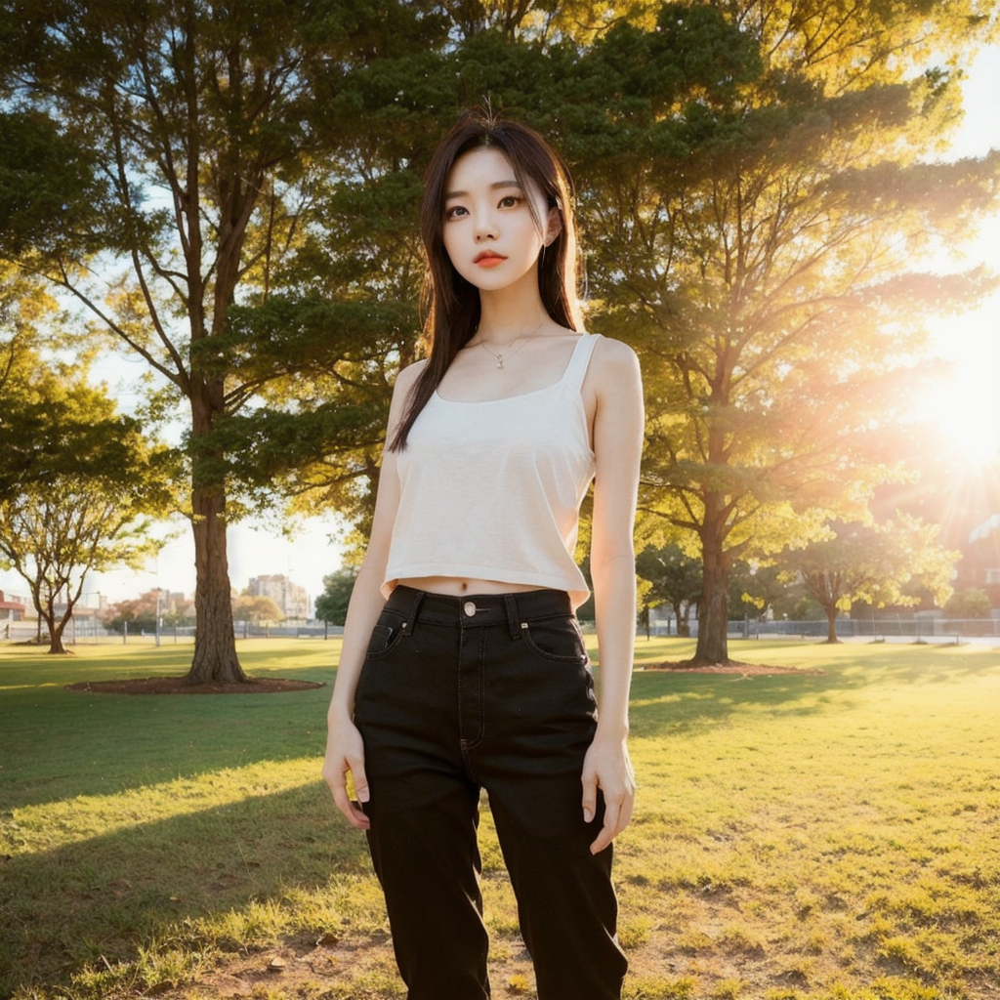

In [ ]:
# Import test image
image_location = "/content/drive/My Drive/AI Consistent Generation/BAR_Pipeline_Test/SD15_Unrealistic_Bad.png"

test_img = Image.open(image_location)

test_img

In [ ]:
# Test
from transformers import pipeline

test_identifier = pipeline("image-classification", model="bad-anatomy-realism-identifier")

test_identifier(test_img)




Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


[{'label': 'Unrealistic_Bad_Anatomy', 'score': 0.4090612828731537},
 {'label': 'Unrealistic_Good_Anatomy', 'score': 0.2158510535955429},
 {'label': 'Realistic_Good_Anatomy', 'score': 0.21114906668663025},
 {'label': 'Realistic_Bad_Anatomy', 'score': 0.16393858194351196}]

**Model Used To Generate:** SD 1.5 BRAV6 Checkpoint

**Note:** The result I am understanding of due to the hands, head-body ratio, and the very smooth skin.

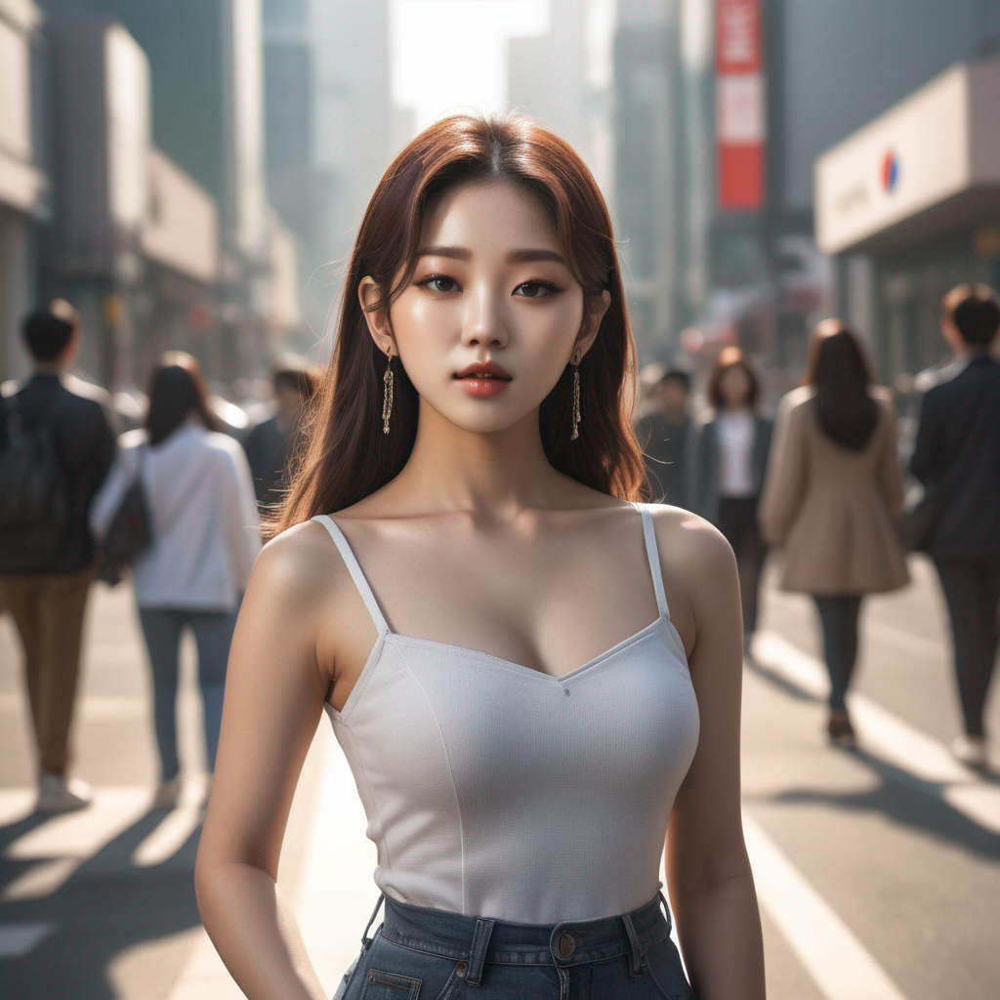

[{'label': 'Unrealistic_Bad_Anatomy', 'score': 0.5951395034790039},
 {'label': 'Unrealistic_Good_Anatomy', 'score': 0.22999021410942078},
 {'label': 'Realistic_Good_Anatomy', 'score': 0.1232014074921608},
 {'label': 'Realistic_Bad_Anatomy', 'score': 0.05166889354586601}]

In [ ]:
# Import test image for OpenDalle
image_location = "/content/drive/My Drive/AI Consistent Generation/BAR_Pipeline_Test/opendalle_Unrealistic_Good.png"

test_img = Image.open(image_location)

display(test_img)

test_identifier(test_img)

**Model Used To Generate:** OpenDalle V1.1

**Note:** The results for this one I would consider wrong, as the anatomy is correct but it is unrealistic as the skin and overall image is too shiny and artificial.

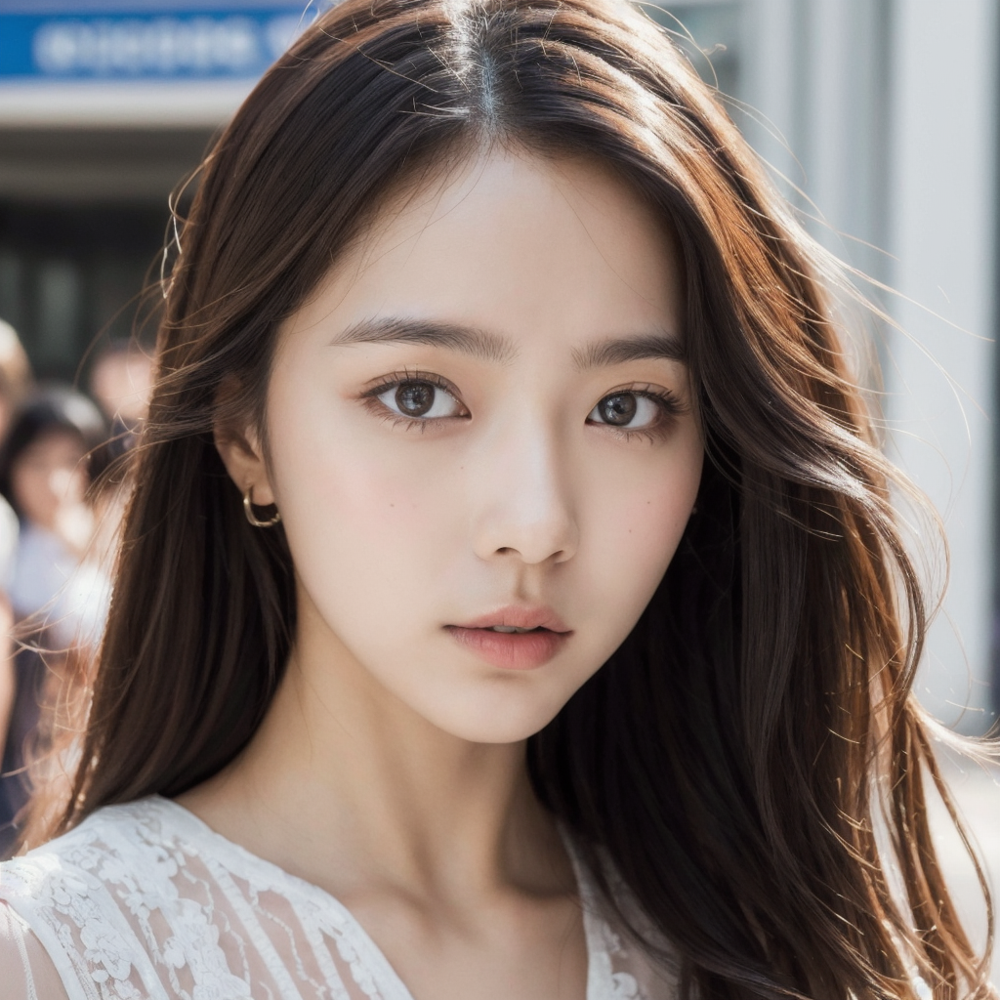

[{'label': 'Realistic_Good_Anatomy', 'score': 0.30850252509117126},
 {'label': 'Unrealistic_Good_Anatomy', 'score': 0.30359965562820435},
 {'label': 'Unrealistic_Bad_Anatomy', 'score': 0.28671830892562866},
 {'label': 'Realistic_Bad_Anatomy', 'score': 0.10117952525615692}]

In [ ]:
# Import test image for SD15
image_location = "/content/drive/My Drive/AI Consistent Generation/BAR_Pipeline_Test/SD15_Realistic_Good.png"

test_img = Image.open(image_location)

display(test_img)

test_identifier(test_img)

**Model Used To Generate:** SD 1.5 BRAV6 Checkpoint

**Note:** It definitely detected Good Anatomy but had a hard time determining Realistic and Unrealistic. It is understandable since this image is really detailed but enough realistic lighting to look like a heavily edited and filtered fashion ad.

## Summary
---
Despite the use of a custom made Data Collator in the Hugging Face tutorial this was based off of, we used the default Data Collator from the model as the data was not stacked or heavily changed before being passed into the Trainer object. This should be fine.

Please check out the model here on Hugging Face: https://huggingface.co/angusleung100/bad-anatomy-realism-classifier

Misc. support files: https://github.com/angusleung100/barc-finetuning-gh


## References
---

Below are the references and tutorials used to create the initial finetuning script:

- https://huggingface.co/blog/fine-tune-vit
- https://huggingface.co/docs/datasets/en/image_dataset

